In [1]:
import pandas as pd 
import re
import string
pd.set_option('display.max_colwidth', 100)
import nltk.corpus
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
import matplotlib.pyplot as plt 
#!pip install seaborn
import seaborn as sns
# !pip install wordcloud
from wordcloud import WordCloud,STOPWORDS
from textblob import TextBlob
from plotly.offline import iplot
# !pip install cufflinks
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [2]:
reviews = pd.read_json('DatasetFinal.json')

In [3]:
reviews.shape

(111582, 7)

In [4]:
reviews.head()

,asin,overall,reviewTime,title,category,imageURLHighRes,reviews
0,B00000DMAN,5,"11 28, 1999",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,"This game is a lot of fun, with a creepy atmosphere that revolves around the disappearance of Ag..."
1,B00000DMAN,4,"03 5, 2003",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,"This was not the best mystery/adventure game I've ever played, and I'm not even a big fan of suc..."
2,B00000DMAN,4,"02 13, 2001",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,"This was a pretty good game, but not a great game. I'd probably rate this closer to 3 1/2 stars...."
3,B00000DMAN,4,"08 19, 2000",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,We stopped watching the series (lack of time) and so this was a nice way to keep the excitement...
4,B00000DMAN,5,"07 27, 2000",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,"As a fan of Myst and Riven, I would not put this game in the same category. However, it does e..."


In [5]:
def f(row):
    
    '''This function returns sentiment value based on the overall ratings from the user'''
    
    if row['overall'] == 3.0:
        val = 'Neutral'
    elif row['overall'] == 1.0 or row['overall'] == 2.0:
        val = 'Negative'
    elif row['overall'] == 4.0 or row['overall'] == 5.0:
        val = 'Positive'
    else:
        val = -1
    return val

In [6]:
reviews['sentiment'] = reviews.apply(f, axis=1)
reviews.head()

,asin,overall,reviewTime,title,category,imageURLHighRes,reviews,sentiment
0,B00000DMAN,5,"11 28, 1999",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,"This game is a lot of fun, with a creepy atmosphere that revolves around the disappearance of Ag...",Positive
1,B00000DMAN,4,"03 5, 2003",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,"This was not the best mystery/adventure game I've ever played, and I'm not even a big fan of suc...",Positive
2,B00000DMAN,4,"02 13, 2001",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,"This was a pretty good game, but not a great game. I'd probably rate this closer to 3 1/2 stars....",Positive
3,B00000DMAN,4,"08 19, 2000",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,We stopped watching the series (lack of time) and so this was a nice way to keep the excitement...,Positive
4,B00000DMAN,5,"07 27, 2000",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,"As a fan of Myst and Riven, I would not put this game in the same category. However, it does e...",Positive


In [7]:
reviews['sentiment'].value_counts()

Positive    81380
Negative    16061
Neutral     14141
Name: sentiment, dtype: int64

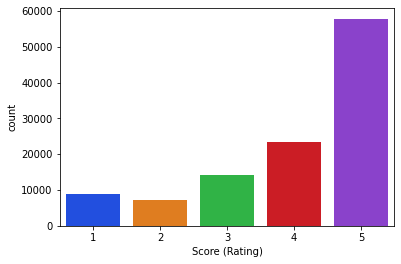

In [8]:
plt.figure()
sns.countplot(x='overall', data=reviews, palette='bright')
plt.xlabel('Score (Rating)')
plt.show()

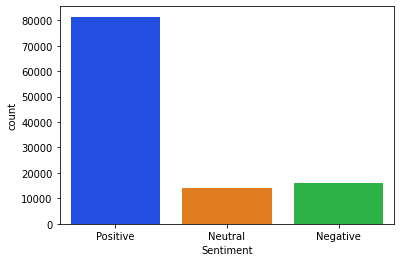

In [9]:
plt.figure()
sns.countplot(x='sentiment', data=reviews, palette='bright')
plt.xlabel('Sentiment')
plt.show()

In [10]:
# new data frame which has date and year
new = reviews["reviewTime"].str.split(",", n = 1, expand = True) 
  
# making separate date column from new data frame 
reviews["date"]= new[0] 
  
# making separate year column from new data frame 
reviews["year"]= new[1] 

reviews=reviews.drop(['reviewTime'], axis=1)
reviews.head()

,asin,overall,title,category,imageURLHighRes,reviews,sentiment,date,year
0,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,"This game is a lot of fun, with a creepy atmosphere that revolves around the disappearance of Ag...",Positive,11 28,1999
1,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,"This was not the best mystery/adventure game I've ever played, and I'm not even a big fan of suc...",Positive,03 5,2003
2,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,"This was a pretty good game, but not a great game. I'd probably rate this closer to 3 1/2 stars....",Positive,02 13,2001
3,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,We stopped watching the series (lack of time) and so this was a nice way to keep the excitement...,Positive,08 19,2000
4,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,"As a fan of Myst and Riven, I would not put this game in the same category. However, it does e...",Positive,07 27,2000


In [11]:
new1 = reviews["date"].str.split(" ", n = 1, expand = True) 
  
# adding month to the main dataset 
reviews["month"]= new1[0] 
  
# adding day to the main dataset 
reviews["day"]= new1[1] 

reviews=reviews.drop(['date'], axis=1)
reviews.head()

,asin,overall,title,category,imageURLHighRes,reviews,sentiment,year,month,day
0,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,"This game is a lot of fun, with a creepy atmosphere that revolves around the disappearance of Ag...",Positive,1999,11,28
1,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,"This was not the best mystery/adventure game I've ever played, and I'm not even a big fan of suc...",Positive,2003,03,5
2,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,"This was a pretty good game, but not a great game. I'd probably rate this closer to 3 1/2 stars....",Positive,2001,02,13
3,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,We stopped watching the series (lack of time) and so this was a nice way to keep the excitement...,Positive,2000,08,19
4,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,"As a fan of Myst and Riven, I would not put this game in the same category. However, it does e...",Positive,2000,07,27


In [12]:
def review_cleaning(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

In [13]:
reviews['reviews']=reviews['reviews'].apply(lambda x:review_cleaning(x))
reviews.head()

,asin,overall,title,category,imageURLHighRes,reviews,sentiment,year,month,day
0,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,this game is a lot of fun with a creepy atmosphere that revolves around the disappearance of age...,Positive,1999,11,28
1,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,this was not the best mysteryadventure game ive ever played and im not even a big fan of such ga...,Positive,2003,03,5
2,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,this was a pretty good game but not a great game id probably rate this closer to stars you are...,Positive,2001,02,13
3,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,we stopped watching the series lack of time and so this was a nice way to keep the excitement g...,Positive,2000,08,19
4,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,as a fan of myst and riven i would not put this game in the same category however it does equa...,Positive,2000,07,27


In [14]:
reviews['reviews'] = reviews['reviews'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

In [15]:
reviews.head()

,asin,overall,title,category,imageURLHighRes,reviews,sentiment,year,month,day
0,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,game lot fun creepy atmosphere revolves around disappearance agents mulder scully ive heard comp...,Positive,1999,11,28
1,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,best mysteryadventure game ive ever played im even big fan games begin serious xphile despite se...,Positive,2003,03,5
2,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,pretty good game great game id probably rate closer stars agent craig wilmore scully mulder disa...,Positive,2001,02,13
3,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,stopped watching series lack time nice way keep excitement going game good perhaps little disori...,Positive,2000,08,19
4,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,fan myst riven would put game category however equally well type myst riven dont main character ...,Positive,2000,07,27


In [16]:
my_max = reviews['year'].astype(str).astype(int).loc[reviews['year'].astype(str).astype(int).idxmax()]
print(my_max)

2018


In [17]:
my_min = reviews['year'].astype(str).astype(int).loc[reviews['year'].astype(str).astype(int).idxmin()]
print(my_min)

1999


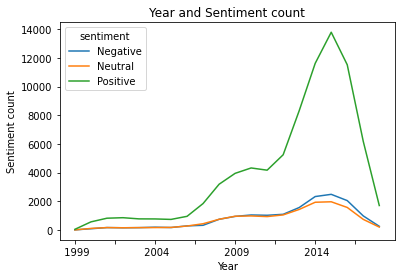

In [18]:
reviews.groupby(['year','sentiment'])['sentiment'].count().unstack().plot(legend=True)
plt.title('Year and Sentiment count')
plt.xlabel('Year')
plt.ylabel('Sentiment count')
plt.show()

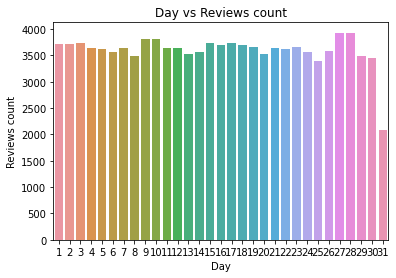

In [19]:
#Creating a dataframe
day=pd.DataFrame(reviews.groupby('day')['reviews'].count()).reset_index()
day['day']=day['day'].astype('int64')
day.sort_values(by=['day'])

#Plotting the graph
sns.barplot(x="day", y="reviews", data=day)
plt.title('Day vs Reviews count')
plt.xlabel('Day')
plt.ylabel('Reviews count')
plt.show()

In [20]:
review_pos = reviews[reviews["sentiment"]=='Positive']
review_neu = reviews[reviews["sentiment"]=='Neutral']
review_neg = reviews[reviews["sentiment"]=='Negative']

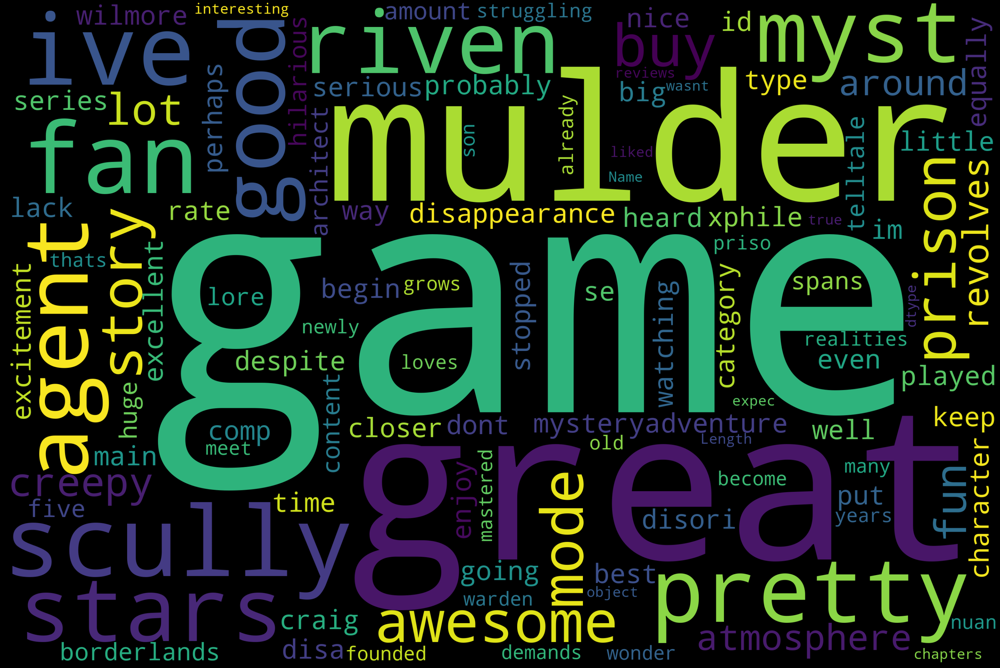

In [21]:
text = review_pos["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

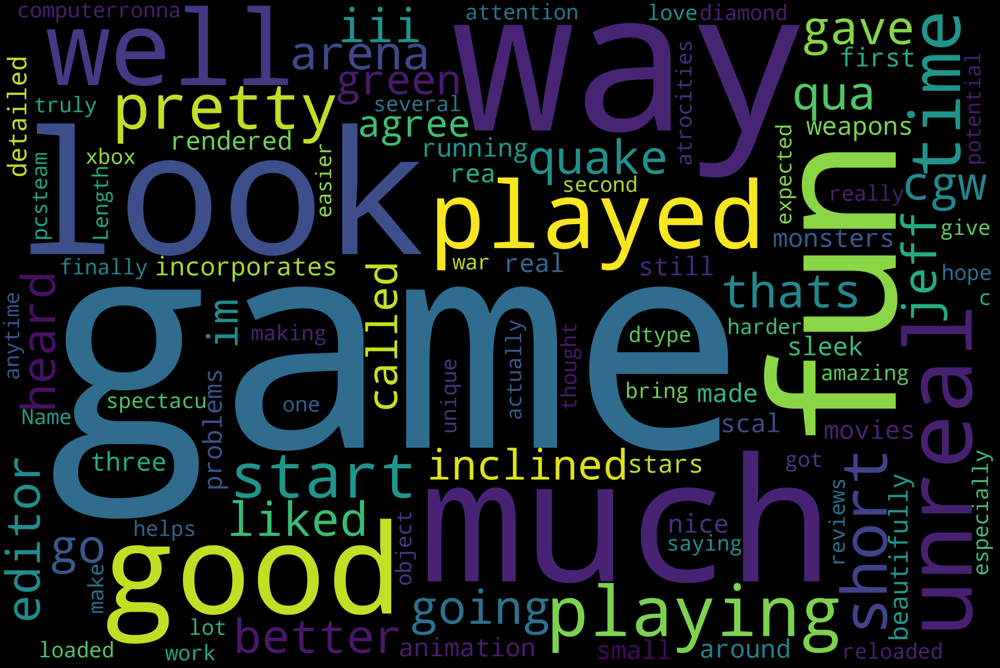

In [22]:
text = review_neu["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

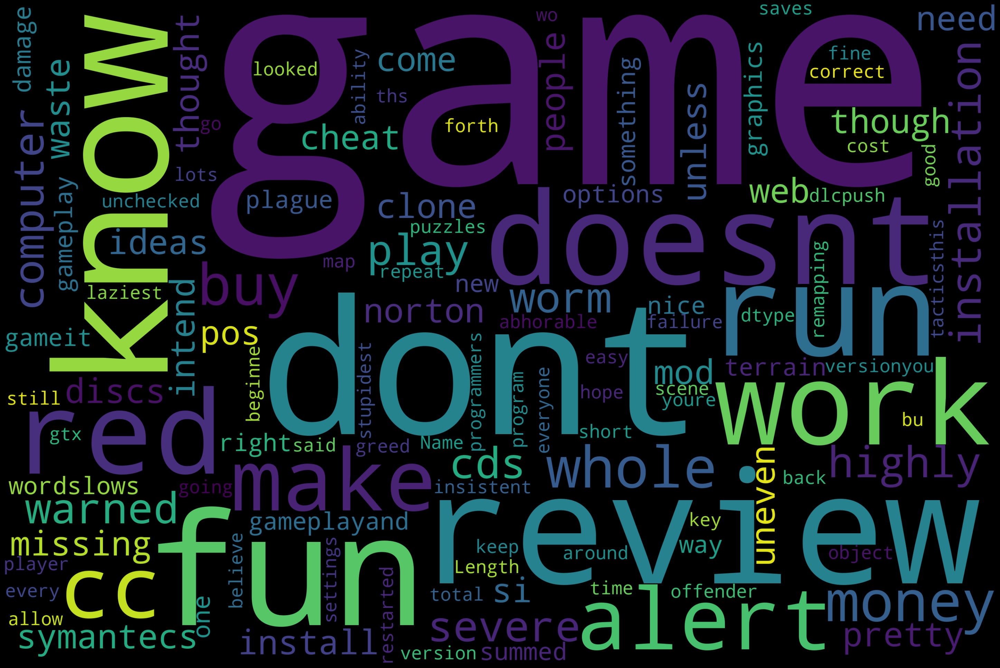

In [23]:
text = review_neg["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [24]:
reviews["review_word_count"] = reviews["reviews"].apply(lambda reviews: len(reviews.split()))

In [25]:
reviews['polarity'] = reviews['reviews'].map(lambda text: TextBlob(text).sentiment.polarity)

In [26]:
reviews['review_len'] = reviews['reviews'].astype(str).apply(len)

In [27]:
reviews.sample(3)

,asin,overall,title,category,imageURLHighRes,reviews,sentiment,year,month,day,review_word_count,polarity,review_len
72912,B00BRQN2EM,3,Saints Row IV,Xbox,https://images-na.ssl-images-amazon.com/images/I/61kvPPXN4kL.jpg,thought okay dont take game seriously funny suppose dlc saints row third oh well also find game ...,Neutral,2013,10,30,26,0.064583,167
94995,B00M9TD584,4,Assassin's Creed Rogue- PlayStation 3,"['Video Games', 'PlayStation 3', 'Games', '</span></span></span>']",https://images-na.ssl-images-amazon.com/images/I/61fLZA6h9ZL.jpg,old small twist story four stars,Positive,2016,04,16,6,-0.075000,32
71840,B00BGA9V2Q,5,Diablo III,"['Video Games', 'PlayStation 3', 'Games', '</span></span></span>']",https://images-na.ssl-images-amazon.com/images/I/41J11BRufiL.jpg,love game boyfriend played separately together like game play like games travel around getting n...,Positive,2014,07,23,49,0.083523,321


In [28]:
reviews.describe()

,overall,review_word_count,polarity,review_len
count,111582.000000,111582.000000,111582.000000,111582.000000
mean,4.024314,83.779328,0.125536,569.759881
std,1.271989,136.342239,0.238943,951.584078
min,1.000000,0.000000,-1.000000,0.000000
25%,3.000000,13.000000,0.000000,81.000000
50%,5.000000,34.000000,0.100000,219.000000
75%,5.000000,95.000000,0.225000,636.000000
max,5.000000,2915.000000,1.000000,21517.000000


<AxesSubplot:xlabel='overall', ylabel='polarity'>

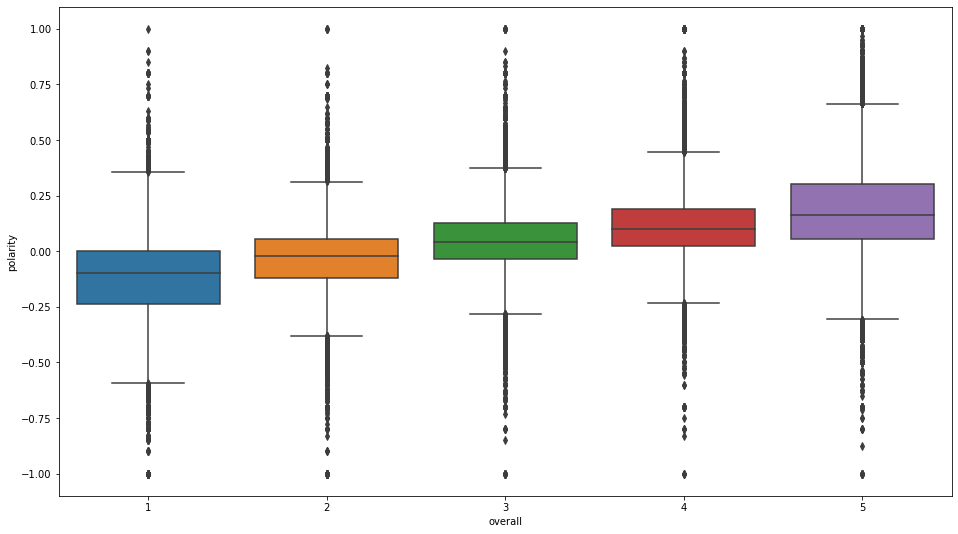

In [29]:
fig, axes = plt.subplots(1, 1, figsize=(16,9))
sns.boxplot( y='polarity', x= 'overall', data=reviews, orient='v')

<AxesSubplot:xlabel='overall', ylabel='polarity'>

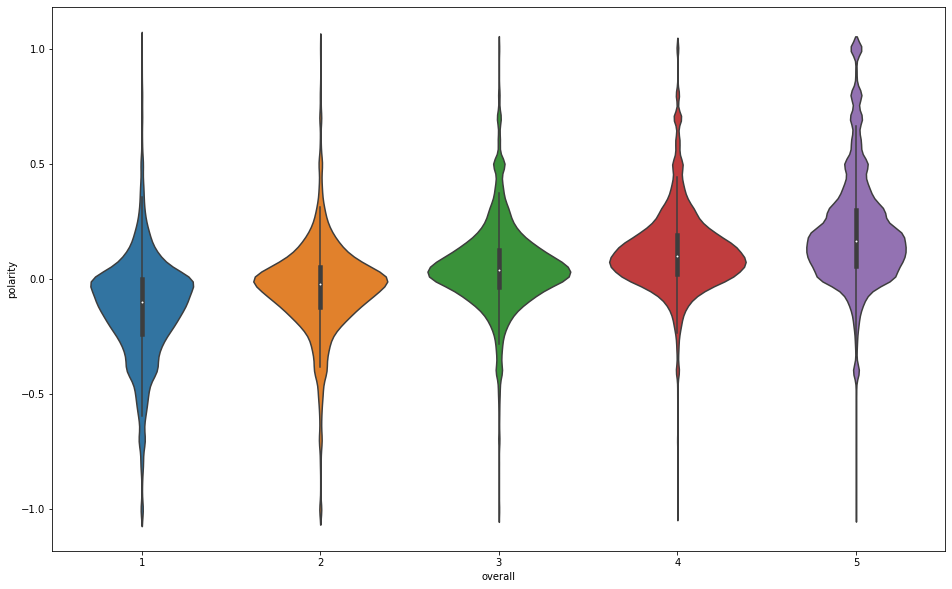

In [30]:
fig, axes = plt.subplots(1, 1, figsize=(16,10))
sns.violinplot( y='polarity', x= 'overall', data=reviews, orient='v')

In [31]:
#!pip install pandas_profiling
#import pandas_profiling

In [32]:
#from pandas_profiling import ProfileReport
#prof = ProfileReport(reviews)
#prof.to_file(output_file='output.html')

In [33]:
reviews['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [34]:
reviews['sentiment'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [35]:
#!pip install gensim
from gensim.models import Word2Vec

In [36]:
reviews.head()

,asin,overall,title,category,imageURLHighRes,reviews,sentiment,year,month,day,review_word_count,polarity,review_len
0,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,game lot fun creepy atmosphere revolves around disappearance agents mulder scully ive heard comp...,Positive,1999,11,28,59,0.180303,389
1,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,best mysteryadventure game ive ever played im even big fan games begin serious xphile despite se...,Positive,2003,03,5,118,0.040064,816
2,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,pretty good game great game id probably rate closer stars agent craig wilmore scully mulder disa...,Positive,2001,02,13,86,0.122619,555
3,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,stopped watching series lack time nice way keep excitement going game good perhaps little disori...,Positive,2000,08,19,138,0.016053,954
4,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images/I/31BDm2VqflL.jpg,fan myst riven would put game category however equally well type myst riven dont main character ...,Positive,2000,07,27,118,-0.057875,776


In [37]:
sent = [row.split(' ') for row in reviews['reviews']]

In [38]:
sent[0]

['game',
 'lot',
 'fun',
 'creepy',
 'atmosphere',
 'revolves',
 'around',
 'disappearance',
 'agents',
 'mulder',
 'scully',
 'ive',
 'heard',
 'complain',
 'wish',
 'mulder',
 'scully',
 'game',
 'think',
 'still',
 'see',
 'enough',
 'keep',
 'fans',
 'happy',
 'plus',
 'found',
 'character',
 'agent',
 'willmore',
 'play',
 'likeable',
 'storyline',
 'strong',
 'puzzles',
 'make',
 'sense',
 'full',
 'motion',
 'video',
 'fmv',
 'sequences',
 'good',
 'many',
 'fmv',
 'games',
 'around',
 'anymore',
 'like',
 'adventure',
 'games',
 'video',
 'sequences',
 'really',
 'must',
 'must',
 'fmv',
 'adventure',
 'fans']

In [39]:
model = Word2Vec(sent, min_count=1,workers=3, window =3, sg = 1)

In [40]:
model.wv['fun']

array([-0.01142496,  0.29960978,  0.432272  ,  0.522792  , -0.21570708,
       -1.2837713 ,  0.23731062,  0.49007994, -0.27361238, -0.12918979,
        0.04028641, -0.23295338,  0.20700951,  0.0380837 ,  0.51378477,
       -0.07297277,  0.17291057, -0.31087384, -0.10790769, -1.2449442 ,
        0.39484668,  0.4460039 ,  0.41335082, -0.52419865, -0.10533148,
        0.17955434, -0.5965295 , -0.12392352, -0.15007049, -0.02414576,
        0.14016256,  0.02809661,  0.26427075, -0.24826609, -0.13624865,
        0.2753536 ,  0.09479048, -0.22750396, -0.14833623, -0.7320267 ,
       -0.16671222,  0.03415208, -0.38316235, -0.31850836,  0.1458139 ,
       -0.10791402, -0.3566909 ,  0.06731761,  0.10099278, -0.14481176,
       -0.42921716,  0.07360875, -0.16890106, -0.11450799,  0.05962551,
        0.16334786,  0.36636025, -0.05183093,  0.04428846,  0.19937599,
       -0.15866575, -0.13949633, -0.11205614, -0.1529168 ,  0.06878495,
        0.66082925, -0.36871895,  0.31351075, -0.74117506, -0.03